In [1]:
import numpy as np
import matplotlib as mpl
mpl.rcParams['text.usetex'] = True
import matplotlib.pyplot as plt
import torch
import math
import collections
from mpl_toolkits.axes_grid1 import make_axes_locatable
from helper.util import extract
from diffusion_model.sampler.ddpm import DDPM

## some constants from ddpm

In [2]:
device='cpu'

In [3]:
# calculate variance for mnist
def cosine_variance_schedule(timesteps,epsilon= 0.008):
    steps=torch.linspace(0,timesteps,steps=timesteps+1,dtype=torch.float32)
    f_t=torch.cos(((steps/timesteps+epsilon)/(1.0+epsilon))*math.pi*0.5)**2
    betas=torch.clip(1.0-f_t[1:]/f_t[:timesteps],0.0,0.999)
    return betas

betas=cosine_variance_schedule(timesteps=1000).to(device)
alphas=1.-betas
alphas_cumprod=torch.cumprod(alphas,dim=-1).to(device)
sqrt_alphas_cumprod=torch.sqrt(alphas_cumprod).to(device)
sqrt_one_minus_alphas_cumprod=torch.sqrt(1.-alphas_cumprod).to(device)

def get_var_mnist(t):
    t = torch.ones(1)*t
    t = t.long()
    alpha_t=alphas.gather(-1,t)
    alpha_t_cumprod=alphas_cumprod.gather(-1,t)
    beta_t=betas.gather(-1,t)
    sqrt_one_minus_alpha_cumprod_t=sqrt_one_minus_alphas_cumprod.gather(-1,t)
    var = beta_t/sqrt_one_minus_alpha_cumprod_t
    return var[0].item()

def get_var_cifar10(t):
    CONFIG_PATH = './configs/cifar10_config.yaml'
    sampler = DDPM(CONFIG_PATH)
    var = sampler.sqrt_one_minus_alpha_bar[t]
    return var.item()

# 1 Jacobian

## A. pixel space

In [22]:
Js_full = np.load('stats/jacobian_t1000.npy')
Js_full = Js_full.reshape(100, 1, 1, 3*32*32, 1, 3*32*32) # 8 batch x 100 t
Js = Js_full[:,0,:] # first batch

In [23]:
ind = list(range(1, 1000, 10))

### histogram

In [190]:
diff_dict = collections.defaultdict(list)
for i in range(Js.shape[0]): # t iter
    for k in range(Js.shape[1]): # sample iter
        diff = Js[i,k,:,k,:].T - Js[i,k,:,k,:]
        diff_dict[i] += list(diff.ravel())

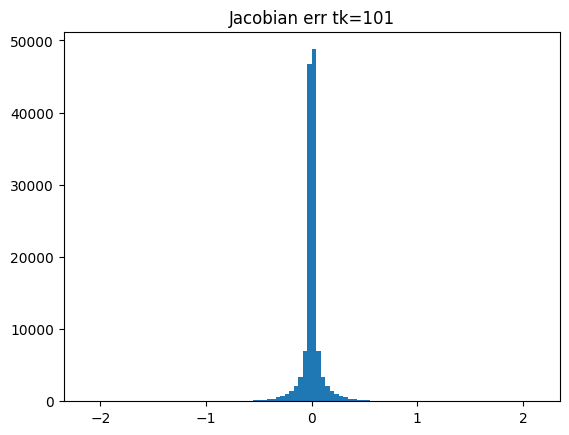

In [197]:
# for i in range(Js_full.shape[0]):
for i in [10]:
    plt.hist(diff_dict[i], bins=100)
    # plt.xlim(-2, 2)
    # plt.ylim(0, 50000)
    plt.title(f"Jacobian err tk={ind[i]}")
    plt.show()

### plot

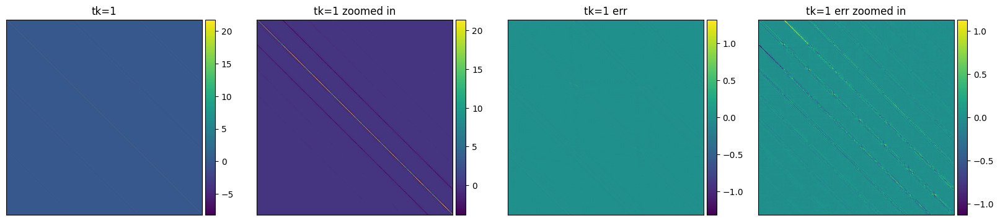

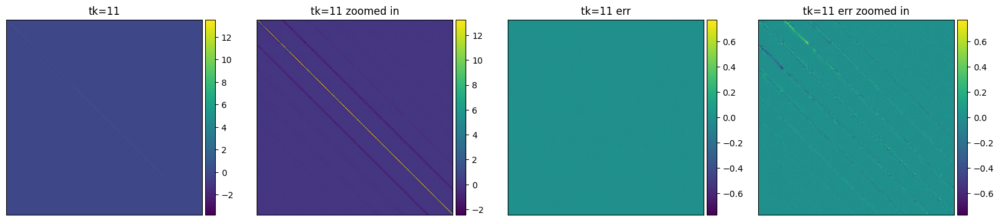

In [24]:
data_idx = 0
for i in range(2):
    fig, axes = plt.subplots(1,4, figsize=(20,5))

    im0 = axes[0].imshow(Js[i][data_idx,:,data_idx,:], cmap='viridis')
    axes[0].set_title(f"tk={ind[i]}")
    
    im1 = axes[1].imshow(Js[i][data_idx,:250,data_idx,:250], cmap='viridis')
    axes[1].set_title(f"tk={ind[i]} zoomed in")

    diff = (Js[i][data_idx,:,data_idx,:].T - Js[i][data_idx,:,data_idx,:])
    im2 = axes[2].imshow(diff, cmap='viridis')
    axes[2].set_title(f"tk={ind[i]} err")

    im3 = axes[3].imshow(diff[:250,:250], cmap='viridis')
    axes[3].set_title(f"tk={ind[i]} err zoomed in")
    
    for ax, im in zip(axes, [im0, im1, im2, im3]):
        ax.set_xticks([])
        ax.set_yticks([])
        div = make_axes_locatable(ax)
        cax = div.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(im, cax=cax)
    # axes[0].colorbar()
    plt.show()

## B. latent space

In [50]:
Js_full = np.load('stats/jacobian_ldm_t1000.npy')
Js_full = Js_full.reshape(100, 1, 2, 768, 2, 768) # 8 batch x 100 t
Js = Js_full[:,0,:] # first batch

In [26]:
ind = list(range(1, 1000, 10))

### histogram

In [195]:
diff_dict = collections.defaultdict(list)
for i in range(Js_full.shape[0]): # t iter
    for j in range(Js_full.shape[1]): # batch iter
        for k in range(Js_full.shape[2]): # sample iter
            diff = Js_full[i,j,k,:,k,:].T - Js_full[i,j,k,:,k,:]
            diff_dict[i] += list(diff.ravel())

In [196]:
diff[0,0]

np.float32(0.0)

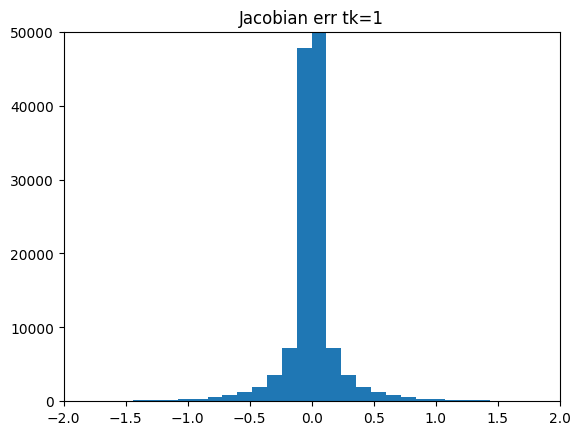

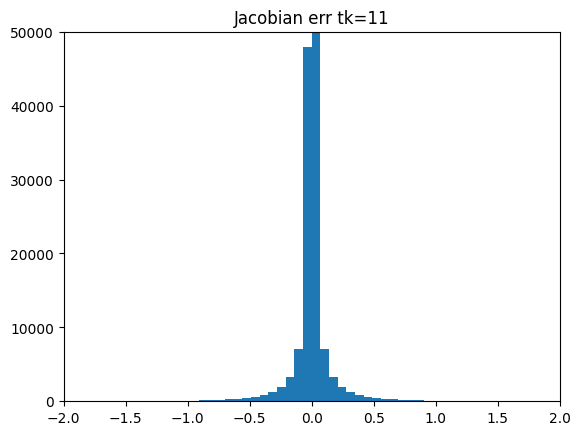

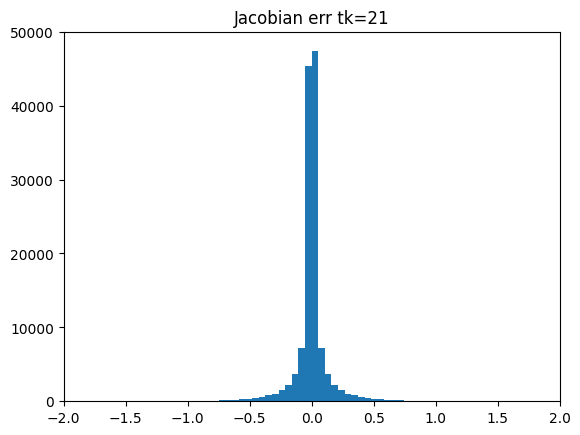

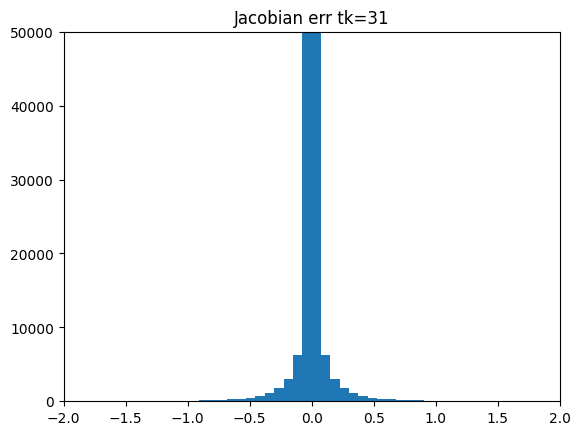

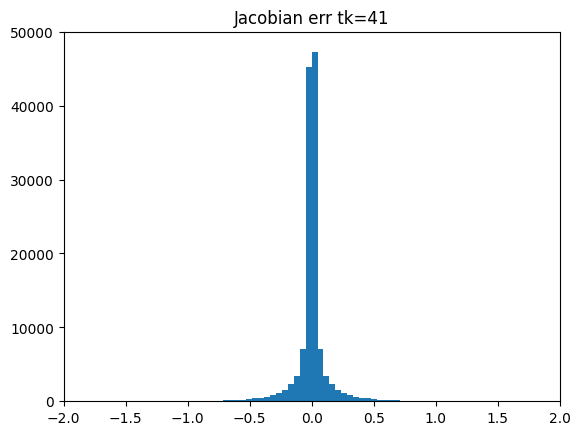

...

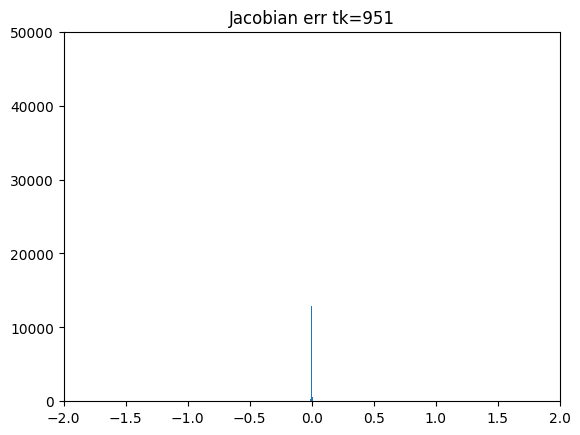

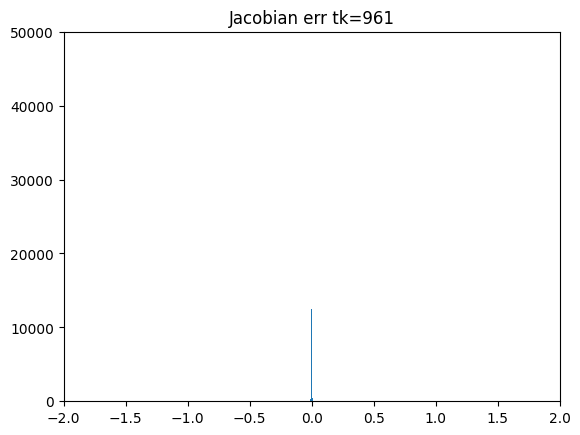

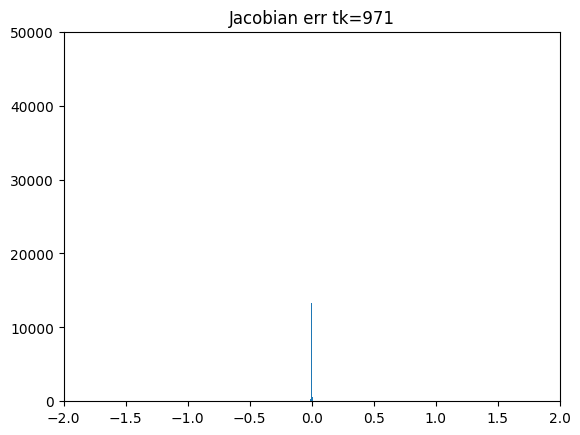

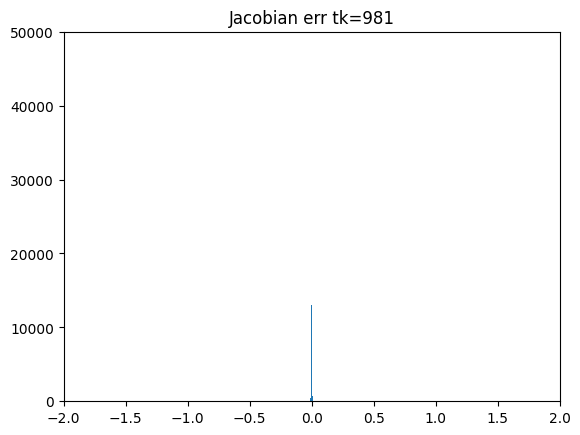

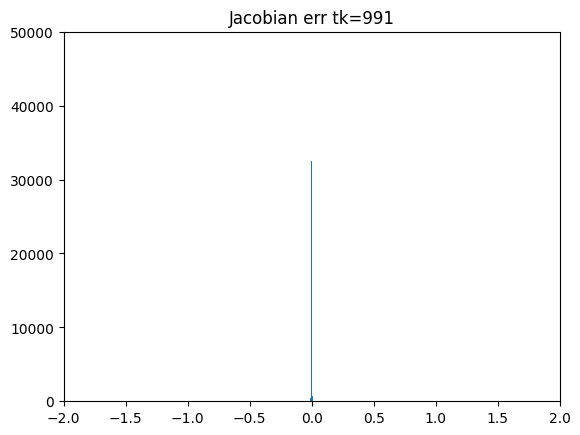

In [185]:
for i in range(Js_full.shape[0]):
    plt.hist(diff_dict[i], bins=100)
    plt.xlim(-2, 2)
    plt.ylim(0, 50000)
    plt.title(f"Jacobian err tk={ind[i]}")
    plt.show()

### plot

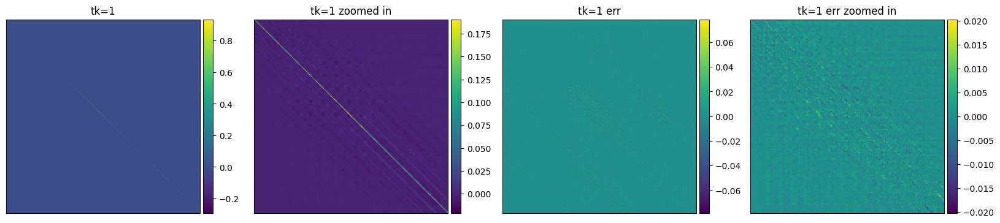

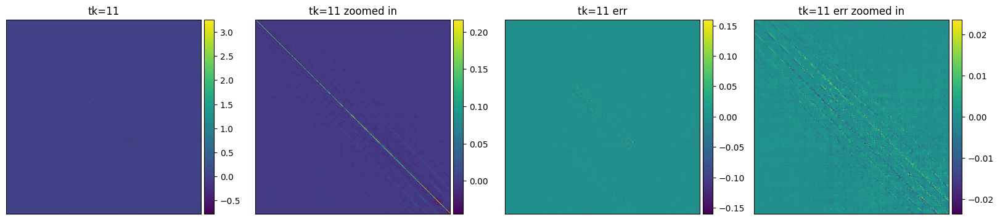

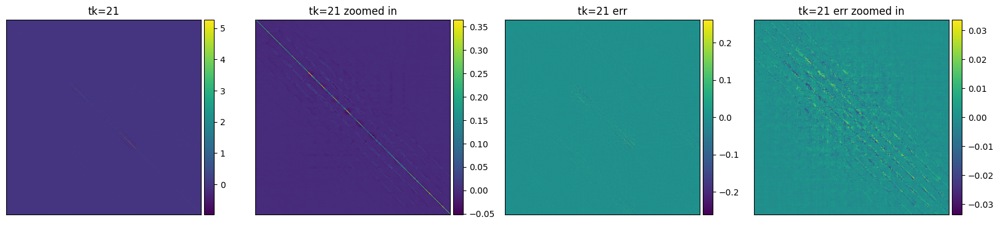

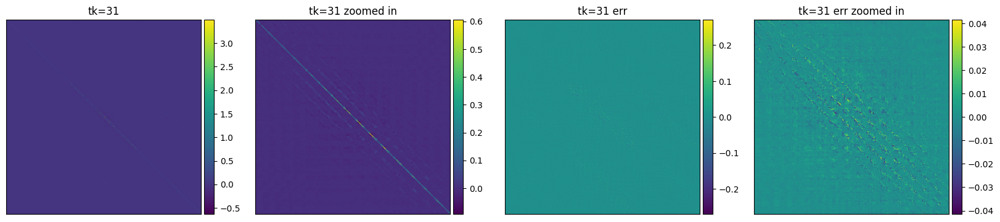

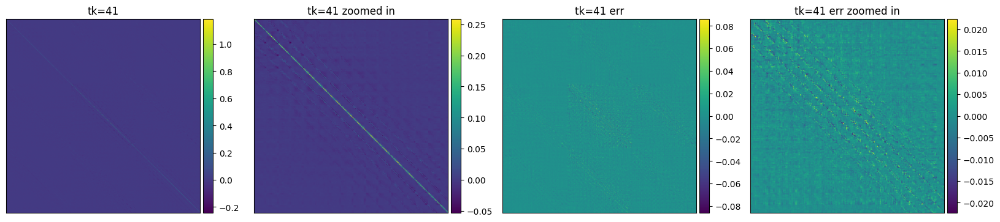

...

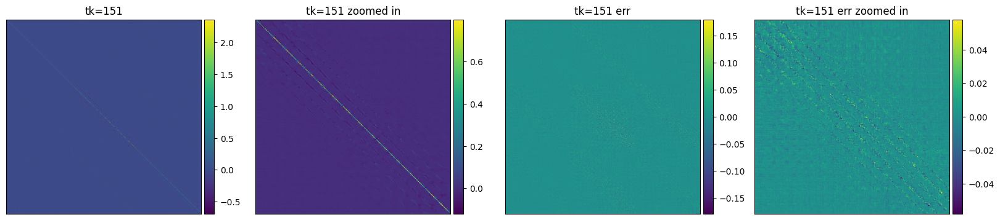

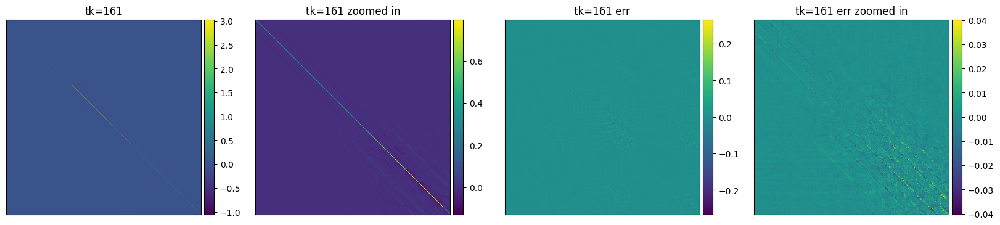

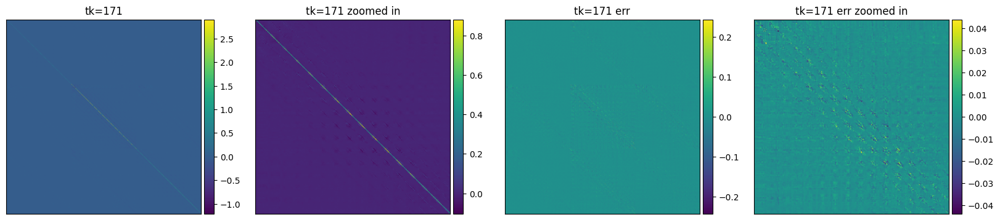

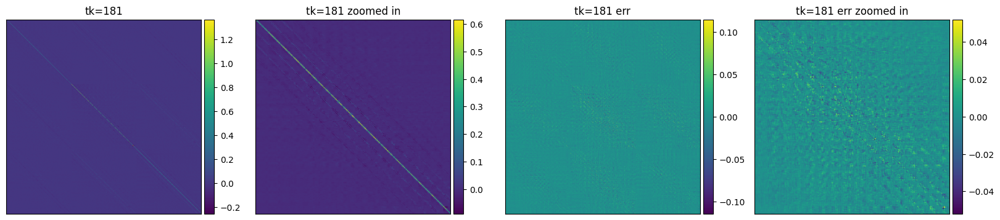

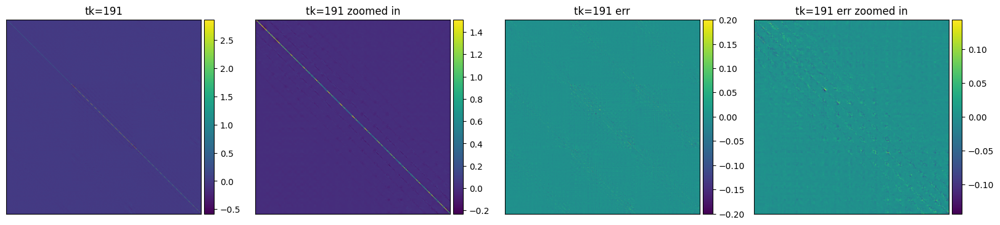

In [27]:
data_idx = 0
for i in range(20):
    fig, axes = plt.subplots(1,4, figsize=(20,5))

    im0 = axes[0].imshow(Js[i][data_idx,:,data_idx,:], cmap='viridis')
    axes[0].set_title(f"tk={ind[i]}")
    
    im1 = axes[1].imshow(Js[i][data_idx,:250,data_idx,:250], cmap='viridis')
    axes[1].set_title(f"tk={ind[i]} zoomed in")

    diff = (Js[i][data_idx,:,data_idx,:].T - Js[i][data_idx,:,data_idx,:])
    im2 = axes[2].imshow(diff, cmap='viridis')
    axes[2].set_title(f"tk={ind[i]} err")

    im3 = axes[3].imshow(diff[:250,:250], cmap='viridis')
    axes[3].set_title(f"tk={ind[i]} err zoomed in")
    
    for ax, im in zip(axes, [im0, im1, im2, im3]):
        ax.set_xticks([])
        ax.set_yticks([])
        div = make_axes_locatable(ax)
        cax = div.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(im, cax=cax)
    # axes[0].colorbar()
    plt.show()

# 2.0 All plots

In [4]:
ldm = True
trained = True
N_sim = 1000
data = 'mnist'
if data == 'cifar10':
    root = 'stats'
    var_array = []
    for t in list(range(1, N_sim, 10)) + [N_sim-1]:
        var_array.append(get_var_cifar10(t))
    var_array = np.array(var_array).reshape(-1, 1)
    std_array = np.sqrt(var_array)
    
elif data == 'mnist':
    root = '../../MNISTDiffusion/stats'
    var_array = []
    for t in list(range(1, N_sim, 10)) + [N_sim-1]:
        var_array.append(get_var_mnist(t))
    var_array = np.array(var_array).reshape(-1, 1)
    std_array = np.sqrt(var_array)

if not ldm:
    brownian_data = np.load(f'{root}/brownian_walk_t{N_sim}_simplified.npy', allow_pickle=True)
    rotation_data = np.load(f'{root}/rotation_walk_t{N_sim}_simplified.npy', allow_pickle=True)
    cheapshot_data = np.load(f'{root}/cheapshot_yt_walk_t{N_sim}_simplified.npy', allow_pickle=True)
else:
    brownian_data = np.load(f'{root}/brownian_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)
    rotation_data = np.load(f'{root}/rotation_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)
    cheapshot_data = np.load(f'{root}/cheapshot_yt_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)

brownian_d_array = brownian_data.ravel()[0]['d_array']
rotation_d_array = rotation_data.ravel()[0]['d_array']
cheapshot_d_array = cheapshot_data.ravel()[0]['d_array']

brownian_int_array = brownian_data.ravel()[0]['int_array']
rotation_int_array = rotation_data.ravel()[0]['int_array']
cheapshot_int_array = cheapshot_data.ravel()[0]['int_array']

brownian_norm_int_array = brownian_data.ravel()[0]['int_norm_array']
rotation_norm_nt_array = rotation_data.ravel()[0]['int_norm_array']
cheapshot_norm_int_array = cheapshot_data.ravel()[0]['int_norm_array']

brownian_norm_int_array_abs = np.abs(brownian_norm_int_array)
rotation_norm_int_array_abs = np.abs(rotation_norm_nt_array)
cheapshot_norm_int_array_abs = np.abs(cheapshot_norm_int_array)

brownian_int_array_abs = np.abs(brownian_int_array)
rotation_int_array_abs = np.abs(rotation_int_array)
cheapshot_int_array_abs = np.abs(cheapshot_int_array)

brownian_int_array_scaled_abs = np.abs(brownian_int_array/var_array)
rotation_int_array_scaled_abs = np.abs(rotation_int_array/var_array)
cheapshot_int_array_scaled_abs = np.abs(cheapshot_int_array/var_array)

d_list = [brownian_d_array, rotation_d_array, cheapshot_d_array]
int_list = [brownian_int_array_abs, rotation_int_array_abs, cheapshot_int_array_abs]
int_norm_list = [brownian_norm_int_array_abs, rotation_norm_int_array_abs, cheapshot_norm_int_array_abs]
int_scaled_list = [brownian_int_array_scaled_abs, rotation_int_array_scaled_abs, cheapshot_int_array_scaled_abs]

x = list(range(1, N_sim, 10)) + [N_sim-1]

In [5]:
# sub jacobian 
if ldm:
    Js_full = np.load(f'{root}/sub_jacobian_ldm_t1000.npy') # (100, 128, 64, 64)
else:
    Js_full = np.load(f'{root}/sub_jacobian_t1000.npy') # (100, 128, 64, 64)

Js_full_abs_diff = np.abs(Js_full - Js_full.transpose(0,1,3,2))

err = Js_full_abs_diff.reshape(101, -1)

In [6]:
err.shape

(101, 1048576)

In [7]:
err_min = err[:,:100000]

In [8]:
mpl.rcParams.update({'font.size': 30})

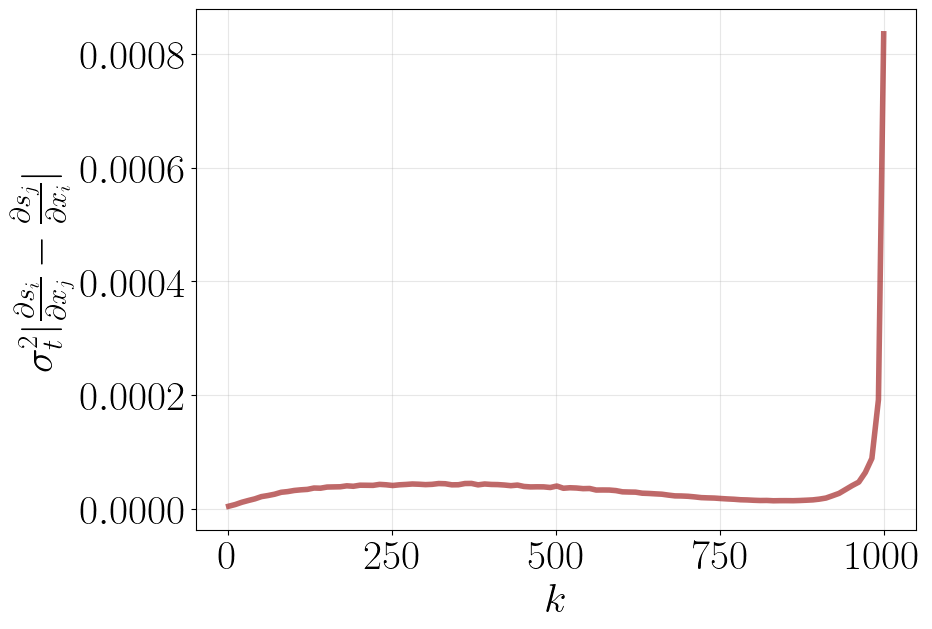

In [9]:
# Plot
fig = plt.figure(figsize=(10,7))

err_scaled = err*var_array

# Compute mean and confidence interval
mean = err_scaled.mean(axis=1)
std = err_scaled.std(axis=1)
ci95 = 1.96 * std / np.sqrt(err_scaled.shape[1])  # 95% confidence interval

plt.plot(x, mean, lw=4, alpha=0.7, label=r'$\textrm{L1 error}$', c='brown')
# plt.plot(x, mean, lw=1, alpha=0.7, label='L1 error')
plt.fill_between(x, mean - ci95, mean + ci95, alpha=0.2)

plt.xlabel(r"$k$")
plt.ylabel(r"$\sigma^{2}_{t}\Bigg| \frac{\partial s_i}{\partial x_j} -\frac{\partial s_j}{\partial x_i} \Bigg|$")
# if not ldm:
#     plt.title(f"Differential constraint error")
# else:
#     plt.title(f"Latent differential constraint error")
# plt.ylim(-1.5, 2)
# plt.legend(frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [114]:
fig.savefig(f'{data}-latent={ldm}-differential-sigma.png', dpi=300)

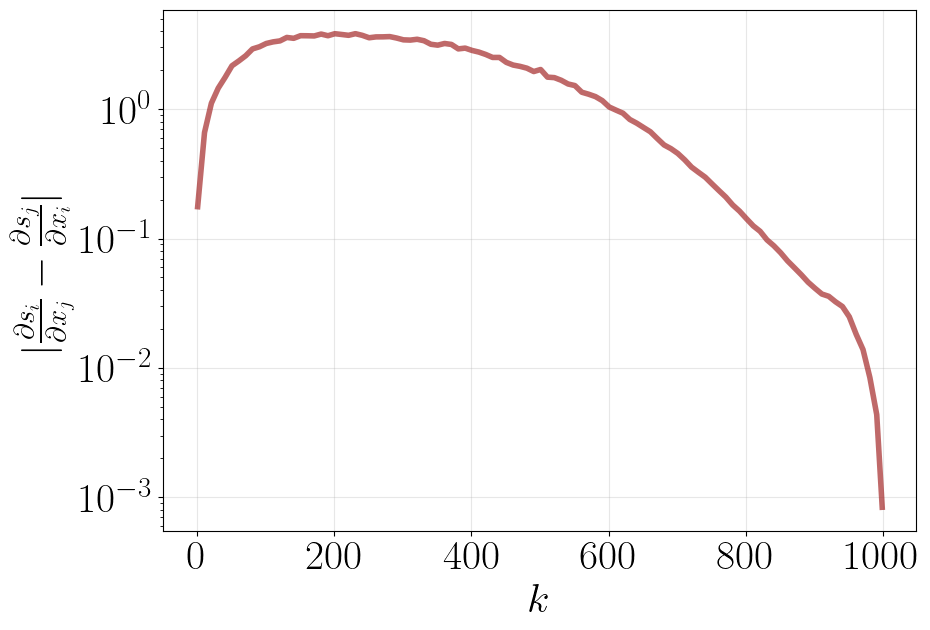

In [10]:
# Plot
fig = plt.figure(figsize=(10,7))

err_scaled = err/var_array

# Compute mean and confidence interval
mean = err_scaled.mean(axis=1)
std = err_scaled.std(axis=1)
ci95 = 1.96 * std / np.sqrt(err.shape[1])  # 95% confidence interval

plt.semilogy(x, mean, lw=4, alpha=0.7, label=r'$\textrm{L1 error}$', c='brown')
# plt.plot(x, mean, lw=1, alpha=0.7, label='L1 error')
# plt.fill_between(x, mean - ci95, mean + ci95, alpha=0.2)

plt.xlabel("$k$")
plt.ylabel(r"$\Bigg| \frac{\partial s_i}{\partial x_j} -\frac{\partial s_j}{\partial x_i}\Bigg|$")
# if not ldm:
#     plt.title(f"Differential constraint error")
# else:
#     plt.title(f"Latent differential constraint error")
# plt.ylim(-1.5, 2)
# plt.legend(frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [116]:
fig.savefig(f'{data}-latent={ldm}-differential.png', dpi=300)

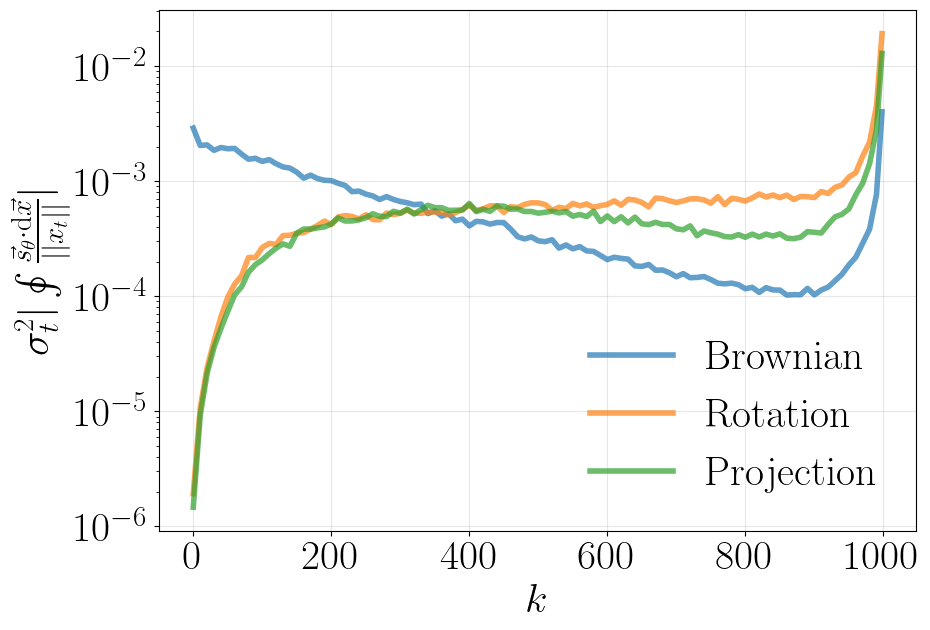

In [11]:
# Plot
fig = plt.figure(figsize=(10,7))

for int_array, label, c in zip(int_norm_list, ["Brownian", "Rotation", "Projection"], ['orange', 'red', 'blue']):
    int_array_scaled = int_array*var_array # scale to correct var
    # Compute mean and confidence interval
    mean = int_array_scaled.mean(axis=1)
    std = int_array_scaled.std(axis=1)
    ci95 = 1.96 * std / np.sqrt(int_array_scaled.shape[1])  # 95% confidence interval
    
    plt.semilogy(x, mean, lw=4, label=fr"$\textrm{{{label}}}$", alpha=0.7)
    # plt.fill_between(x, mean - std, mean + std, alpha=0.2)

# if not ldm or data=='cifar10':
#     plt.ylim(-2, 100)
plt.xlabel(r"$k$")
# plt.ylabel("Score integrals (absolute value)")
plt.ylabel(r"$\sigma^{2}_{t}\Bigg|\oint \frac{\vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x_{t}||} \Bigg|$")
# if not ldm:
#     plt.title(r"Score integral constraint with 95\% confidence interval")
# else:
#     plt.title(r"Latent score integral constraint with 95\% confidence interval")
plt.legend(frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [118]:
fig.savefig(f'{data}-latent={ldm}-integral-signa-scaled-len.png', dpi=300)

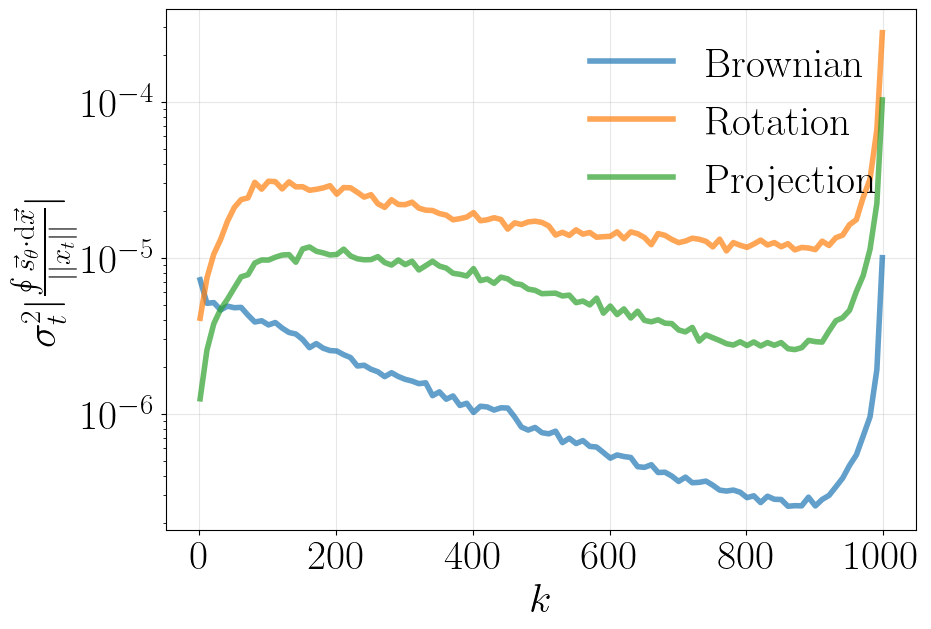

In [13]:
# Plot
fig = plt.figure(figsize=(10,7))

for int_array, d_array, label, c in zip(int_norm_list, d_list, ["Brownian", "Rotation", "Projection"], ['orange', 'red', 'blue']):
    int_array_scaled = int_array*var_array/d_array # scale to correct var
    # Compute mean and confidence interval
    mean = int_array_scaled.mean(axis=1)
    std = int_array_scaled.std(axis=1)
    ci95 = 1.96 * std / np.sqrt(int_array_scaled.shape[1])  # 95% confidence interval
    
    plt.semilogy(x, mean, lw=4, label=fr"$\textrm{{{label}}}$", alpha=0.7)
    # plt.fill_between(x, mean - std, mean + std, alpha=0.2)

# if not ldm or data=='cifar10':
#     plt.ylim(-2, 100)
plt.xlabel(r"$k$")
# plt.ylabel("Score integrals (absolute value)")
plt.ylabel(r"$\sigma^{2}_{t}\Bigg|\frac{\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x_{t}||} \Bigg|$")
# if not ldm:
#     plt.title(r"Score integral constraint with 95\% confidence interval")
# else:
#     plt.title(r"Latent score integral constraint with 95\% confidence interval")
plt.legend(frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [120]:
fig.savefig(f'{data}-latent={ldm}-integral-signa-scaled.png', dpi=300)

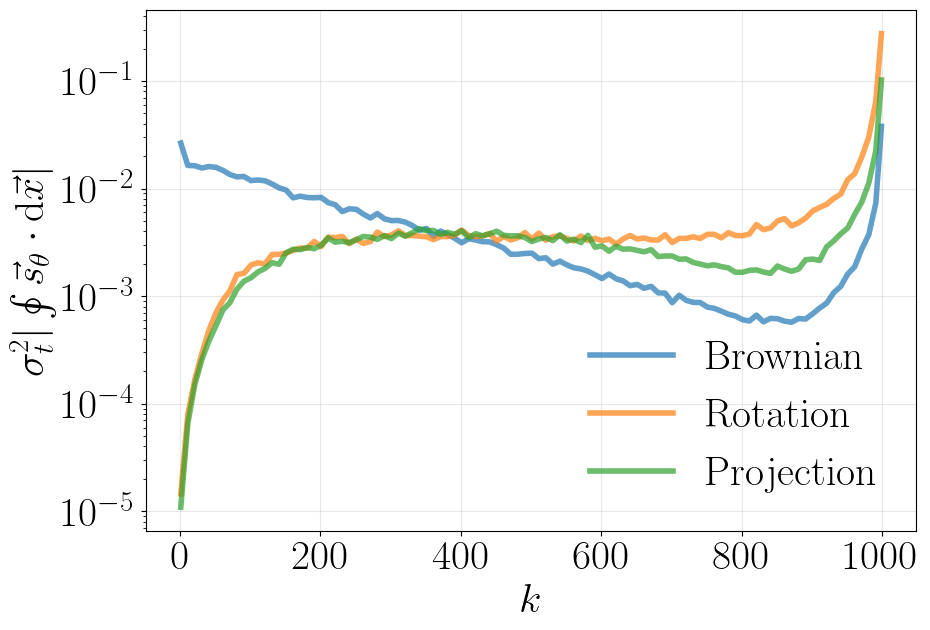

In [14]:
# Plot
fig = plt.figure(figsize=(10,7))

for int_array, label, c in zip(int_list, ["Brownian", "Rotation", "Projection"], ['orange', 'red', 'blue']):
    int_array_scaled = int_array*var_array
    # Compute mean and confidence interval
    mean = int_array_scaled.mean(axis=1)
    std = int_array_scaled.std(axis=1)
    ci95 = 1.96 * std / np.sqrt(int_array_scaled.shape[1])  # 95% confidence interval
    
    plt.semilogy(x, mean, lw=4, label=fr"$\textrm{{{label}}}$", alpha=0.7)
    # plt.fill_between(x, mean - std, mean + std, alpha=0.2)

# if not ldm or data=='cifar10':
#     plt.ylim(-2, 100)
plt.xlabel("$k$")
# plt.ylabel("Score integrals (absolute value)")
plt.ylabel(r"$\sigma^{2}_{t}\Bigg|\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x} \Bigg|$")
# if not ldm:
#     plt.title(r"Score integral constraint with 95\% confidence interval")
# else:
#     plt.title(r"Latent score integral constraint with 95\% confidence interval")
plt.legend(frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [122]:
fig.savefig(f'{data}-latent={ldm}-integral-sigma.png', dpi=300)

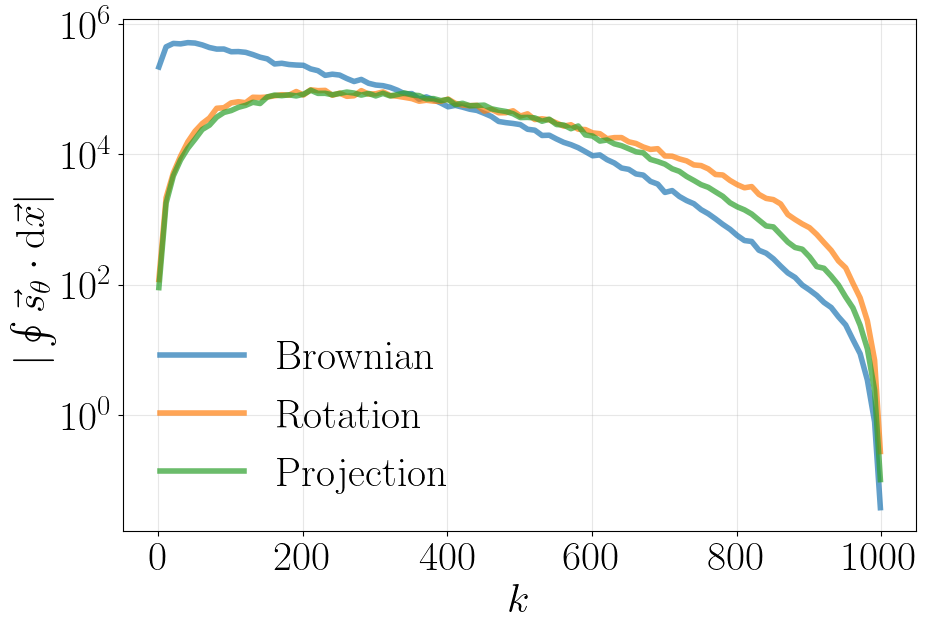

In [15]:
# Plot
fig = plt.figure(figsize=(10,7))

for int_array, label, c in zip(int_scaled_list, ["Brownian", "Rotation", "Projection"], ['orange', 'red', 'blue']):
    int_array_scaled = int_array/var_array
    # Compute mean and confidence interval
    mean = int_array_scaled.mean(axis=1)
    std = int_array_scaled.std(axis=1)
    ci95 = 1.96 * std / np.sqrt(int_array_scaled.shape[1])  # 95% confidence interval
    
    plt.semilogy(x, mean, lw=4, label=fr"$\textrm{{{label}}}$", alpha=0.7)
    # plt.fill_between(x, mean - std, mean + std, alpha=0.2)

# if not ldm or data=='cifar10':
#     plt.ylim(-2, 100)
plt.xlabel("$k$")
# plt.ylabel("Score integrals (absolute value)")
plt.ylabel(r"$\Bigg|\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x} \Bigg|$")
# if not ldm:
#     plt.title(r"Score integral constraint with 95\% confidence interval")
# else:
#     plt.title(r"Latent score integral constraint with 95\% confidence interval")
plt.legend(frameon=False)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [124]:
fig.savefig(f'{data}-latent={ldm}-integral.png', dpi=300)

## mixed plots

In [17]:
show_idn = np.arange(0, 101, 5)

In [18]:
import seaborn as sns

In [19]:
ldm = False
trained = True
N_sim = 1000
data = 'mnist'
if data == 'cifar10':
    root = 'stats'
elif data == 'mnist':
    root = '../../MNISTDiffusion/stats'

brownian_data = np.load(f'{root}/brownian_walk_t{N_sim}_simplified.npy', allow_pickle=True)
rotation_data = np.load(f'{root}/rotation_walk_t{N_sim}_simplified.npy', allow_pickle=True)
cheapshot_data = np.load(f'{root}/cheapshot_yt_walk_t{N_sim}_simplified.npy', allow_pickle=True)

brownian_data_ldm = np.load(f'{root}/brownian_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)
rotation_data_ldm = np.load(f'{root}/rotation_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)
cheapshot_data_ldm = np.load(f'{root}/cheapshot_yt_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)

brownian_int_array = -var_array*brownian_data.ravel()[0]['int_array'] # reverse direction from the noise
rotation_int_array = -var_array*rotation_data.ravel()[0]['int_array']
cheapshot_int_array = -var_array*cheapshot_data.ravel()[0]['int_array']
brownian_int_array_ldm = -var_array*brownian_data_ldm.ravel()[0]['int_array']
rotation_int_array_ldm = -var_array*rotation_data_ldm.ravel()[0]['int_array']
cheapshot_int_array_ldm = -var_array*cheapshot_data_ldm.ravel()[0]['int_array']

brownian_int_array_scaled = -brownian_data.ravel()[0]['int_array']/var_array # reverse direction from the noise
rotation_int_array_scaled = -rotation_data.ravel()[0]['int_array']/var_array
cheapshot_int_array_scaled = -cheapshot_data.ravel()[0]['int_array']/var_array
brownian_int_array_ldm_scaled = -brownian_data_ldm.ravel()[0]['int_array']/var_array
rotation_int_array_ldm_scaled = -rotation_data_ldm.ravel()[0]['int_array']/var_array
cheapshot_int_array_ldm_scaled = -cheapshot_data_ldm.ravel()[0]['int_array']/var_array

brownian_norm_int_array = -var_array*brownian_data.ravel()[0]['int_norm_array'] # reverse direction from the noise
rotation_norm_int_array = -var_array*rotation_data.ravel()[0]['int_norm_array']
cheapshot_norm_int_array = -var_array*cheapshot_data.ravel()[0]['int_norm_array']
brownian_norm_int_array_ldm = -var_array*brownian_data_ldm.ravel()[0]['int_norm_array']
rotation_norm_int_array_ldm = -var_array*rotation_data_ldm.ravel()[0]['int_norm_array']
cheapshot_norm_int_array_ldm = -var_array*cheapshot_data_ldm.ravel()[0]['int_norm_array']

# int_list = [brownian_int_array_abs, rotation_int_array_abs, cheapshot_int_array_abs]

x = list(range(1, N_sim, 10)) + [N_sim-1]

FileNotFoundError: [Errno 2] No such file or directory: '../../MNISTDiffusion/stats/cheapshot_yt_walk_t1000_simplified.npy'

In [57]:
xticks = [0, 4, 8, 12, 16, 20]
xticks_labels = [f"${i}$" for i in [0, 200, 400, 600, 800, 1000]]

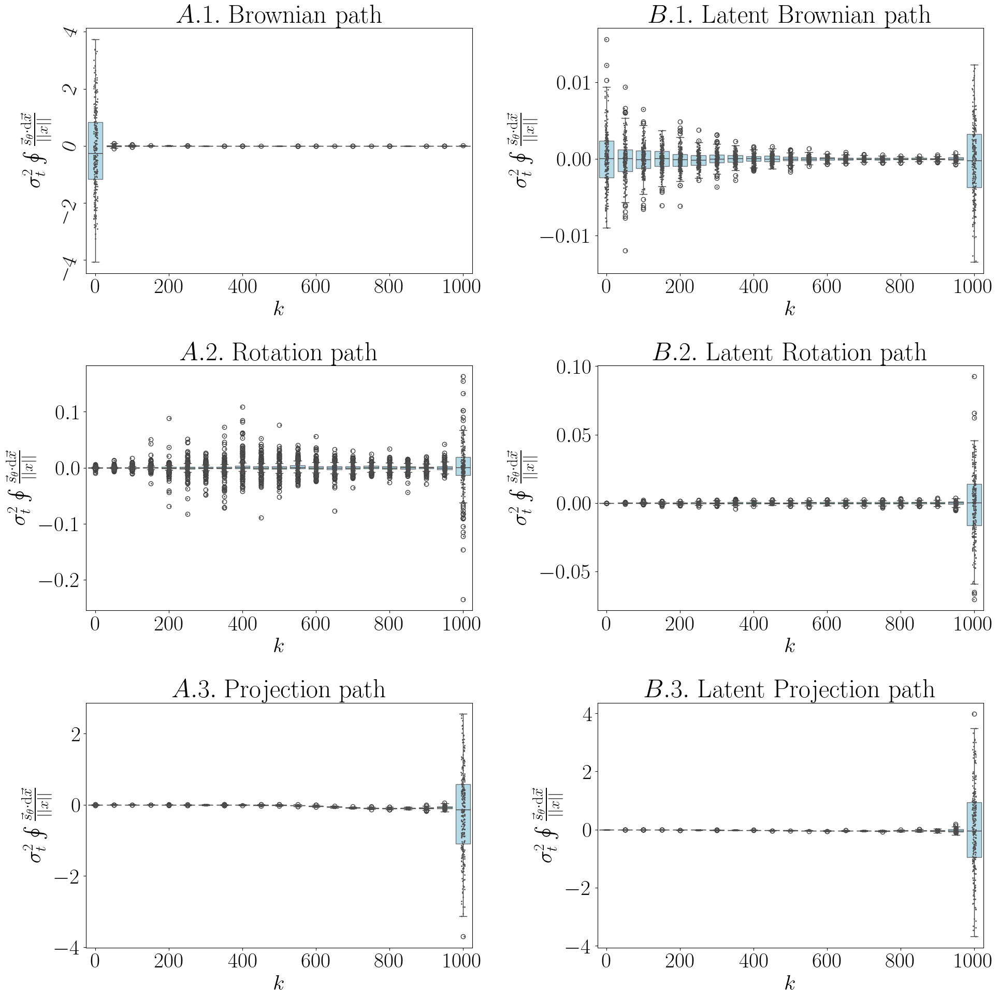

In [58]:
fig, axes = plt.subplots(3,2,figsize=(20,20))
axes = axes.ravel()

# brownian
sns.boxplot(list(brownian_norm_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[0])
sns.stripplot(list(brownian_norm_int_array[show_idn]), size=2, color=".3", ax=axes[0])
axes[0].set_ylabel(r"$\sigma_{t}^{2}\oint \frac{\vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x||}$")
axes[0].tick_params('y', labelrotation=70)
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[0].set_xlabel(r'$k$')
axes[0].set_xticks(xticks, xticks_labels)
axes[0].set_title(r'$A.1. \textrm{ Brownian path}$')
# axes[0].set_yticks(rotation=90)

# brownian ldm
sns.boxplot(list(brownian_norm_int_array_ldm[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[1])
sns.stripplot(list(brownian_norm_int_array_ldm[show_idn]), size=2, color=".3", ax=axes[1])
axes[1].set_ylabel(r"$\sigma_{t}^{2}\oint \frac{\vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x||}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[1].set_xlabel(r'$k$')
axes[1].set_xticks(xticks, xticks_labels)
axes[1].set_title(r'$B.1. \textrm{ Latent Brownian path}$')
# axes[0].set_yticks(rotation=90)

# rotation
sns.boxplot(list(rotation_norm_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[2])
sns.stripplot(list(rotation_norm_int_array[show_idn]), size=2, color=".3", ax=axes[2])
axes[2].set_ylabel(r"$\sigma_{t}^{2}\oint \frac{\vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x||}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[2].set_xlabel(r'$k$')
axes[2].set_xticks(xticks, xticks_labels)
# axes[2].set_ylim(-50,50)
axes[2].set_title(r'$A.2. \textrm{ Rotation path}$')

# rotation ldm
sns.boxplot(list(rotation_norm_int_array_ldm[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[3])
sns.stripplot(list(rotation_norm_int_array_ldm[show_idn]), size=2, color=".3", ax=axes[3])
axes[3].set_ylabel(r"$\sigma_{t}^{2}\oint \frac{\vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x||}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[3].set_xlabel(r'$k$')
axes[3].set_xticks(xticks, xticks_labels)
# axes[3].set_ylim(-5,5)
axes[3].set_title(r'$B.2. \textrm{ Latent Rotation path}$')

# projection
sns.boxplot(list(cheapshot_norm_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[4])
sns.stripplot(list(cheapshot_norm_int_array[show_idn]), size=2, color=".3", ax=axes[4])
axes[4].set_ylabel(r"$\sigma_{t}^{2}\oint \frac{\vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x||}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[4].set_xlabel(r'$k$')
axes[4].set_xticks(xticks, xticks_labels)
# axes[4].set_ylim(-50,50)
axes[4].set_title(r'$A.3. \textrm{ Projection path}$')

# projection
sns.boxplot(list(cheapshot_norm_int_array_ldm[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[5])
sns.stripplot(list(cheapshot_norm_int_array_ldm[show_idn]), size=2, color=".3", ax=axes[5])
axes[5].set_ylabel(r"$\sigma_{t}^{2}\oint \frac{\vec{s}_{\theta}\cdot {\rm d}\vec{x}}{||x||}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[5].set_xlabel(r'$k$')
axes[5].set_xticks(xticks, xticks_labels)
# axes[5].set_ylim(-5,5)
axes[5].set_title(r'$B.3. \textrm{ Latent Projection path}$')


plt.tight_layout()
plt.show()

fig.savefig(f"{data}-fig3_sigma_scaled.png", dpi=300, bbox_inches = 'tight' )

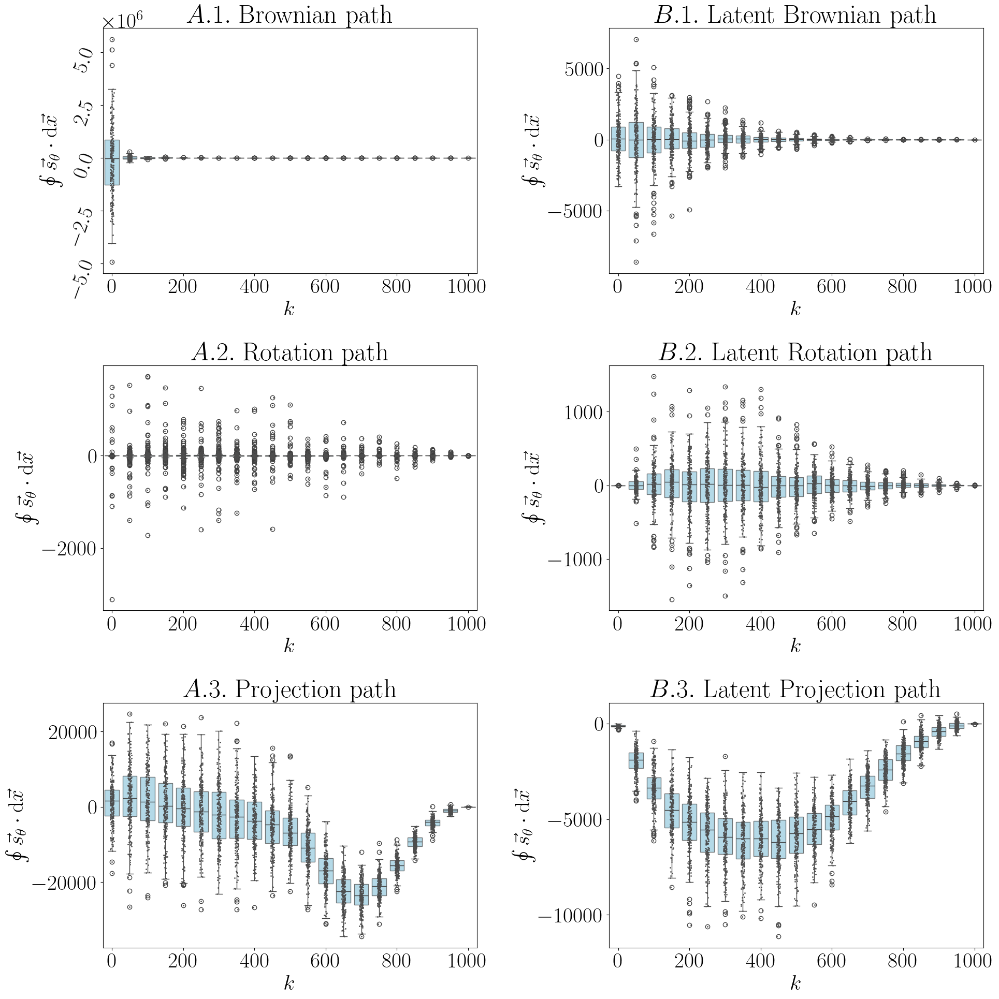

In [59]:
fig, axes = plt.subplots(3,2,figsize=(20,20))
axes = axes.ravel()

# brownian
sns.boxplot(list(brownian_int_array_scaled[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[0])
sns.stripplot(list(brownian_int_array_scaled[show_idn]), size=2, color=".3", ax=axes[0])
axes[0].set_ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
axes[0].tick_params('y', labelrotation=70)
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[0].set_xlabel(r'$k$')
axes[0].set_xticks(xticks, xticks_labels)
axes[0].set_title(r'$A.1. \textrm{ Brownian path}$')
# axes[0].set_yticks(rotation=90)

# brownian ldm
sns.boxplot(list(brownian_int_array_ldm_scaled[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[1])
sns.stripplot(list(brownian_int_array_ldm_scaled[show_idn]), size=2, color=".3", ax=axes[1])
axes[1].set_ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[1].set_xlabel(r'$k$')
axes[1].set_xticks(xticks, xticks_labels)
axes[1].set_title(r'$B.1. \textrm{ Latent Brownian path}$')
# axes[0].set_yticks(rotation=90)

# rotation
sns.boxplot(list(rotation_int_array_scaled[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[2])
sns.stripplot(list(rotation_int_array_scaled[show_idn]), size=2, color=".3", ax=axes[2])
axes[2].set_ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[2].set_xlabel(r'$k$')
axes[2].set_xticks(xticks, xticks_labels)
# axes[2].set_ylim(-50,50)
axes[2].set_title(r'$A.2. \textrm{ Rotation path}$')

# rotation ldm
sns.boxplot(list(rotation_int_array_ldm_scaled[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[3])
sns.stripplot(list(rotation_int_array_ldm_scaled[show_idn]), size=2, color=".3", ax=axes[3])
axes[3].set_ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[3].set_xlabel(r'$k$')
axes[3].set_xticks(xticks, xticks_labels)
# axes[3].set_ylim(-5,5)
axes[3].set_title(r'$B.2. \textrm{ Latent Rotation path}$')

# projection
sns.boxplot(list(cheapshot_int_array_scaled[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[4])
sns.stripplot(list(cheapshot_int_array_scaled[show_idn]), size=2, color=".3", ax=axes[4])
axes[4].set_ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[4].set_xlabel(r'$k$')
axes[4].set_xticks(xticks, xticks_labels)
# axes[4].set_ylim(-50,50)
axes[4].set_title(r'$A.3. \textrm{ Projection path}$')

# projection
sns.boxplot(list(cheapshot_int_array_ldm_scaled[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[5])
sns.stripplot(list(cheapshot_int_array_ldm_scaled[show_idn]), size=2, color=".3", ax=axes[5])
axes[5].set_ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[5].set_xlabel(r'$k$')
axes[5].set_xticks(xticks, xticks_labels)
# axes[5].set_ylim(-5,5)
axes[5].set_title(r'$B.3. \textrm{ Latent Projection path}$')


plt.tight_layout()
plt.show()

fig.savefig(f"{data}-fig3.png", dpi=300, bbox_inches = 'tight' )

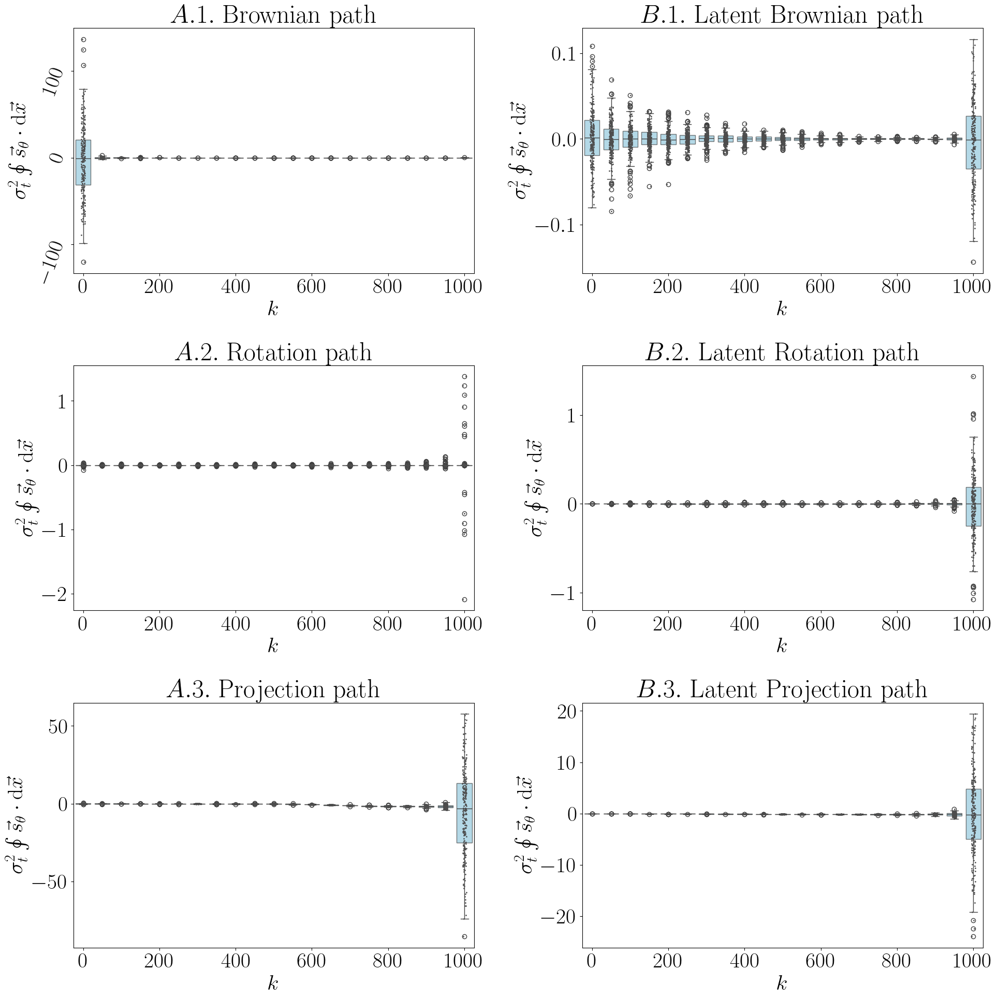

In [60]:
fig, axes = plt.subplots(3,2,figsize=(20,20))
axes = axes.ravel()

# brownian
sns.boxplot(list(brownian_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[0])
sns.stripplot(list(brownian_int_array[show_idn]), size=2, color=".3", ax=axes[0])
axes[0].set_ylabel(r"$\sigma_{t}^{2}\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
axes[0].tick_params('y', labelrotation=70)
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[0].set_xlabel(r'$k$')
axes[0].set_xticks(xticks, xticks_labels)
axes[0].set_title(r'$A.1. \textrm{ Brownian path}$')
# axes[0].set_yticks(rotation=90)

# brownian ldm
sns.boxplot(list(brownian_int_array_ldm[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[1])
sns.stripplot(list(brownian_int_array_ldm[show_idn]), size=2, color=".3", ax=axes[1])
axes[1].set_ylabel(r"$\sigma_{t}^{2}\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[1].set_xlabel(r'$k$')
axes[1].set_xticks(xticks, xticks_labels)
axes[1].set_title(r'$B.1. \textrm{ Latent Brownian path}$')
# axes[0].set_yticks(rotation=90)

# rotation
sns.boxplot(list(rotation_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[2])
sns.stripplot(list(rotation_int_array[show_idn]), size=2, color=".3", ax=axes[2])
axes[2].set_ylabel(r"$\sigma_{t}^{2}\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[2].set_xlabel(r'$k$')
axes[2].set_xticks(xticks, xticks_labels)
# axes[2].set_ylim(-50,50)
axes[2].set_title(r'$A.2. \textrm{ Rotation path}$')

# rotation ldm
sns.boxplot(list(rotation_int_array_ldm[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[3])
sns.stripplot(list(rotation_int_array_ldm[show_idn]), size=2, color=".3", ax=axes[3])
axes[3].set_ylabel(r"$\sigma_{t}^{2}\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[3].set_xlabel(r'$k$')
axes[3].set_xticks(xticks, xticks_labels)
# axes[3].set_ylim(-5,5)
axes[3].set_title(r'$B.2. \textrm{ Latent Rotation path}$')

# projection
sns.boxplot(list(cheapshot_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[4])
sns.stripplot(list(cheapshot_int_array[show_idn]), size=2, color=".3", ax=axes[4])
axes[4].set_ylabel(r"$\sigma_{t}^{2}\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[4].set_xlabel(r'$k$')
axes[4].set_xticks(xticks, xticks_labels)
# axes[4].set_ylim(-50,50)
axes[4].set_title(r'$A.3. \textrm{ Projection path}$')

# projection
sns.boxplot(list(cheapshot_int_array_ldm[show_idn]), color='skyblue', boxprops=dict(alpha=.7), ax=axes[5])
sns.stripplot(list(cheapshot_int_array_ldm[show_idn]), size=2, color=".3", ax=axes[5])
axes[5].set_ylabel(r"$\sigma_{t}^{2}\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
axes[5].set_xlabel(r'$k$')
axes[5].set_xticks(xticks, xticks_labels)
# axes[5].set_ylim(-5,5)
axes[5].set_title(r'$B.3. \textrm{ Latent Projection path}$')


plt.tight_layout()
plt.show()

fig.savefig(f"{data}-fig3_sigma.png", dpi=300, bbox_inches = 'tight' )

In [138]:
# fig = plt.figure(figsize=(10,5))
# sns.boxplot(list(brownian_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7))
# sns.stripplot(list(brownian_int_array[show_idn]), size=2, color=".3")
# plt.ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# # plt.ticklabel_format(axis='y', style='sci', scilimits=(2,2))
# plt.xlabel(r'$t_{k}$')
# plt.xticks([0, 4, 8, 12, 16, 19], [f"${i}$" for i in [0, 200, 400, 600, 800, 1000]])
# plt.yticks(rotation=90)
# # plt.title(f"{method}" + title)
# # sns.despine(trim=True, left=True)
# plt.tight_layout()
# plt.show()
# fig.savefig(f'{data}-latent={ldm}-differential-brownian.png', dpi=300, bbox_inches = 'tight')

In [139]:
# fig = plt.figure(figsize=(10,5))
# sns.boxplot(list(rotation_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7))
# sns.stripplot(list(rotation_int_array[show_idn]), size=2, color=".3")
# plt.ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# # plt.ticklabel_format(axis='y', style='sci', scilimits=(4,5))
# plt.xlabel(r'$t_{k}$')
# plt.xticks([0, 4, 8, 12, 16, 19], [f"${i}$" for i in [0, 200, 400, 600, 800, 1000]])
# # plt.title(f"{method}" + title)
# # sns.despine(trim=True, left=True)
# # plt.ylim(-5,5)
# plt.ylim(-50,50)
# plt.tight_layout()
# # plt.show()
# fig.savefig(f'{data}-latent={ldm}-differential-rotation.png', dpi=300, bbox_inches = 'tight')

In [140]:
# fig = plt.figure(figsize=(10,5))
# sns.boxplot(list(cheapshot_int_array[show_idn]), color='skyblue', boxprops=dict(alpha=.7))
# sns.stripplot(list(cheapshot_int_array[show_idn]), size=2, color=".3")
# plt.ylabel(r"$\oint \vec{s}_{\theta}\cdot {\rm d}\vec{x}$")
# # plt.ticklabel_format(axis='y', style='sci', scilimits=(4,5))
# plt.xlabel(r'$t_{k}$')
# plt.xticks([0, 4, 8, 12, 16, 19], [f"${i}$" for i in [0, 200, 400, 600, 800, 1000]])
# # plt.title(f"{method}" + title)
# # sns.despine(trim=True, left=True)
# # plt.ylim(-5,5)
# plt.ylim(-50,50)
# plt.tight_layout()
# plt.show()
# fig.savefig(f'{data}-latent={ldm}-differential-projection.png', dpi=300, bbox_inches = 'tight')

In [141]:
# # Compute mean and confidence interval
# mean = cheapshot_int_array_abs.mean(axis=1)
# std = cheapshot_int_array_abs.std(axis=1)
# ci95 = 1.96 * std / np.sqrt(cheapshot_int_array_abs.shape[1])  # 95% confidence interval

# # Plot
# plt.figure(figsize=(8,5))
# plt.plot(x, mean, color="navy", lw=1, label="Mean", alpha=0.7)
# plt.fill_between(x, mean - ci95, mean + ci95, 
#                  color="skyblue", alpha=0.4, label="95% CI")

# plt.xlabel("tk")
# plt.ylabel("Score integrals")
# plt.title(f"Mean with 95% Confidence Interval - unscaled - {method} latent={ldm}")
# plt.legend()
# plt.grid(alpha=0.3)
# plt.show()

# 2 Path integral

In [6]:
method = 'brownian'
ldm = False
trained = True
N_sim = 1000

if trained:
    if not ldm:
        title = ' cifar10'
        ret_dict = np.load(f'stats/{method}_walk_t{N_sim}_simplified.npy', allow_pickle=True)
    else:
        title = ' cifar10 - latent'
        ret_dict = np.load(f'stats/{method}_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)
else:
    if not ldm:
        title = ' cifar10 - untrained'
        ret_dict = np.load(f'stats/{method}_walk_t{N_sim}_untrained_simplified.npy', allow_pickle=True)
    else:
        title = ' cifar10 - untrained - latent'
        ret_dict = np.load(f'stats/{method}_walk_ldm_t{N_sim}_simplified.npy', allow_pickle=True)

FileNotFoundError: [Errno 2] No such file or directory: 'stats/brownian_walk_t1000_simplified.npy'

In [49]:
int_array = ret_dict.ravel()[0]['int_array']


In [50]:
int_array = ret_dict.ravel()[0]['int_array']
dl = ret_dict.ravel()[0]['d_array']
int_array_norm = int_array/dl

int_array = ret_dict.ravel()[0]['int_array']
int_array_scaled = int_array.copy()

for i, t in zip(range(int(N_sim/10)), range(1, N_sim, 10)):
    int_array_scaled[i,:] = int_array_scaled[i,:]*sqrt_one_minus_alphas_cumprod[t].item()

int_array_scaled_norm = int_array_scaled/dl

In [51]:
if N_sim == 100:
    ind = list(range(1, N_sim, 10))
    show_idn = np.arange(N_sim//10)
else:
    ind = list(range(1, N_sim, 20))
    show_idn = np.arange(N_sim//10)[::2]

In [52]:
len(show_idn)

50

In [53]:
show_idn

array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32,
       34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66,
       68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98])

## scores

In [54]:
x = np.arange(1, N_sim, 10)

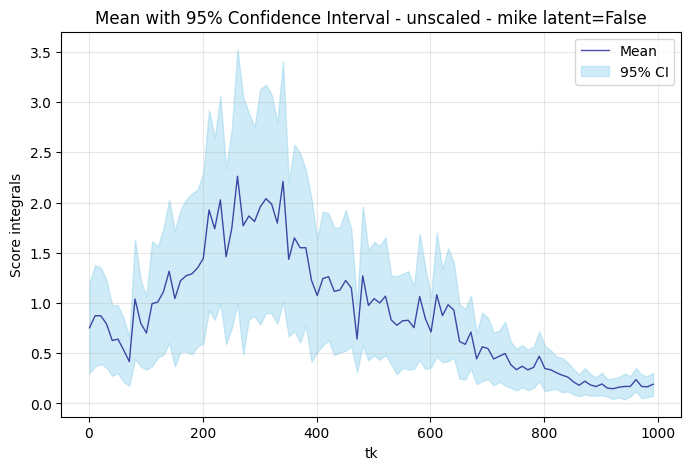

In [58]:
# Compute mean and confidence interval
mean = np.abs(int_array).mean(axis=1)
std = np.abs(int_array).std(axis=1)
ci95 = 1.96 * std / np.sqrt(np.abs(int_array).shape[1])  # 95% confidence interval

# Plot
plt.figure(figsize=(8,5))
plt.plot(x, mean, color="navy", lw=1, label="Mean", alpha=0.7)
plt.fill_between(x, mean - ci95, mean + ci95, 
                 color="skyblue", alpha=0.4, label="95% CI")

plt.xlabel("tk")
plt.ylabel("Score integrals")
plt.title(f"Mean with 95% Confidence Interval - unscaled - {method} latent={ldm}")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

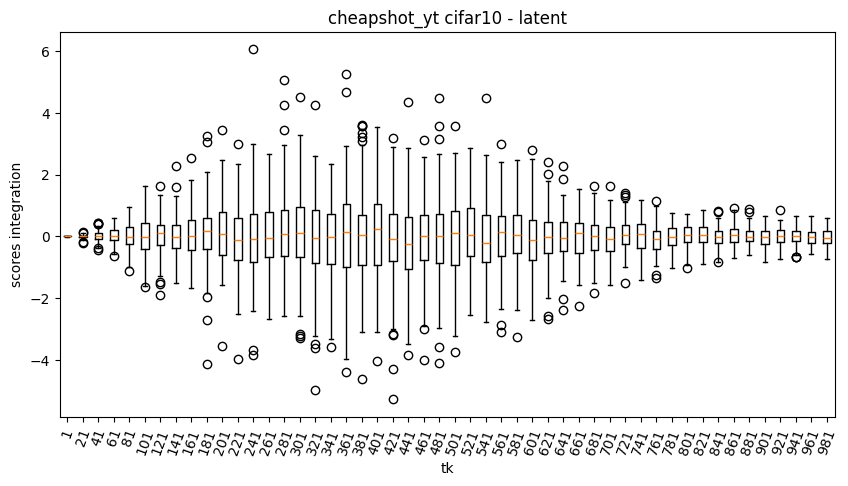

In [9]:
fig = plt.figure(figsize=(10,5))
plt.boxplot(list(int_array[show_idn]), tick_labels=ind)
plt.ylabel('scores integration')
plt.xlabel('tk')
plt.xticks(rotation=70)
plt.title(f"{method}" + title)
plt.show()

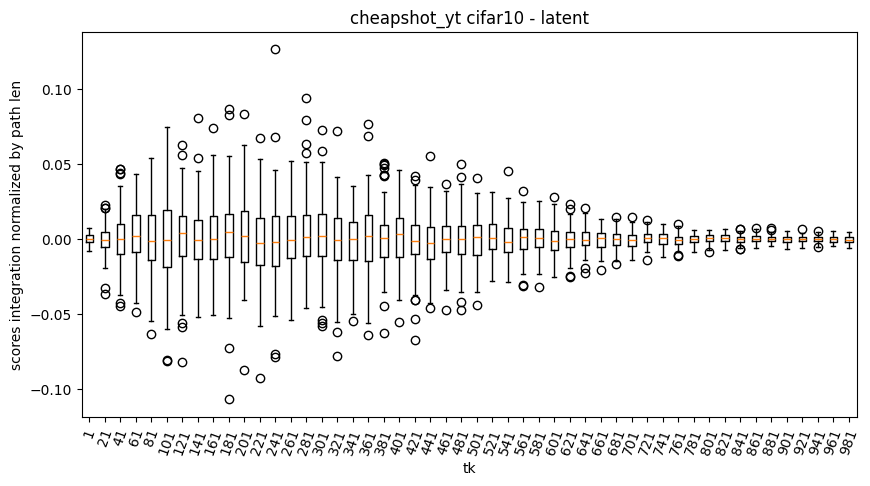

In [10]:
fig = plt.figure(figsize=(10,5))
plt.boxplot(list(int_array_norm[show_idn]), tick_labels=ind)
plt.ylabel('scores integration normalized by path len')
plt.xlabel('tk')
plt.xticks(rotation=70)
plt.title(f"{method}" + title)
plt.show()

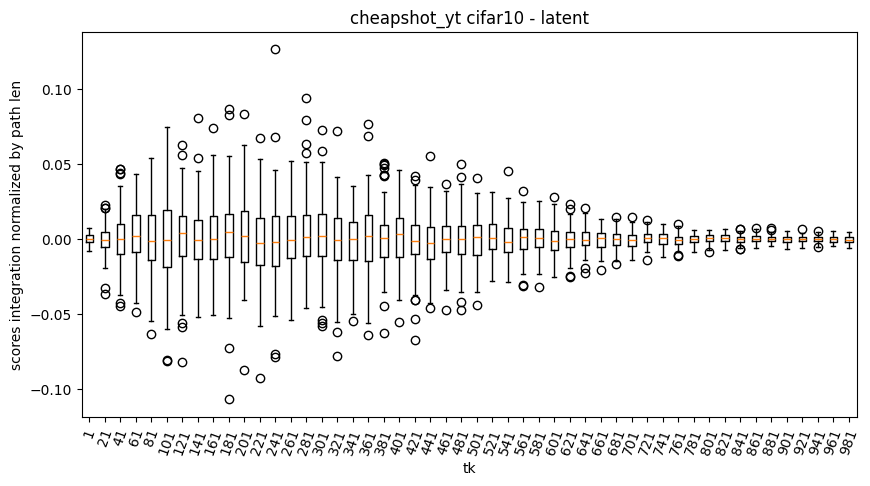

In [11]:
fig = plt.figure(figsize=(10,5))
plt.boxplot(list(int_array_norm[show_idn]), tick_labels=ind)
plt.ylabel('scores integration normalized by path len')
plt.xlabel('tk')
plt.xticks(rotation=70)
plt.title(f"{method}" + title)
plt.show()

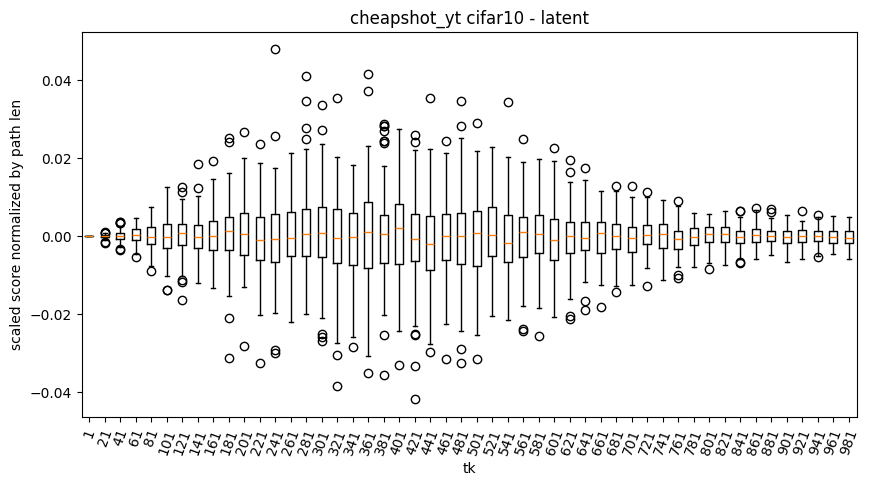

In [12]:
fig = plt.figure(figsize=(10,5))
plt.boxplot(list(int_array_scaled_norm[show_idn]), tick_labels=ind)
plt.ylabel('scaled score normalized by path len')
plt.xlabel('tk')
plt.xticks(rotation=70)
plt.title(f"{method}" + title)
plt.show()

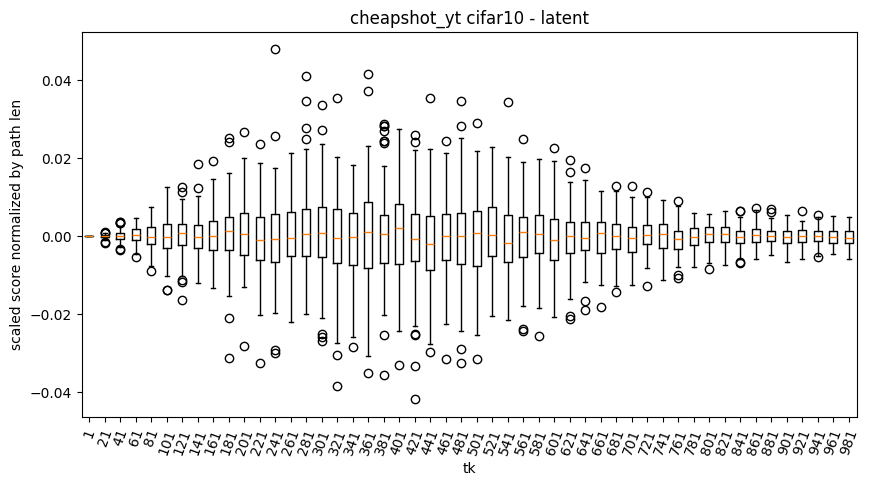

In [13]:
fig = plt.figure(figsize=(10,5))
plt.boxplot(list(int_array_scaled_norm[show_idn]), tick_labels=ind)
plt.ylabel('scaled score normalized by path len')
plt.xlabel('tk')
plt.xticks(rotation=70)
plt.title(f"{method}" + title)
plt.show()

## path length

### simplified

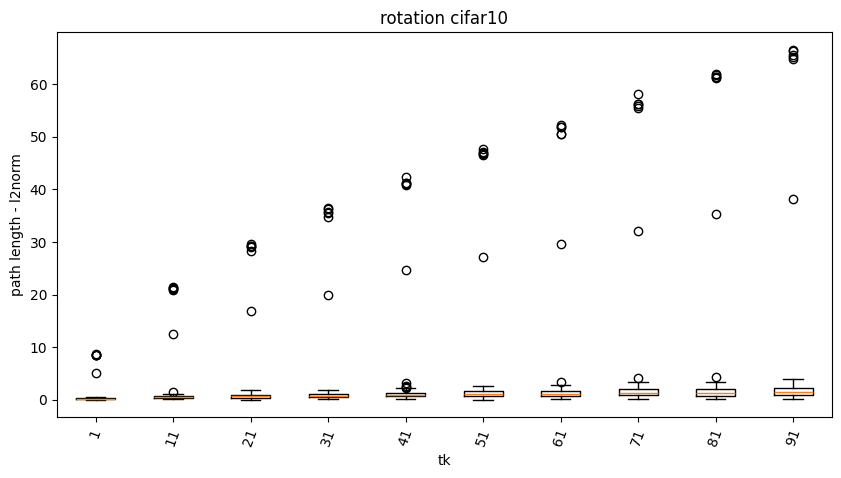

In [85]:
dl = ret_dict.ravel()[0]['d_array']

fig = plt.figure(figsize=(10,5))
plt.boxplot(list(dl[:10]), tick_labels=ind)
plt.ylabel('path length - l2norm')
plt.xlabel('tk')
plt.xticks(rotation=70)
plt.title(f"{method}" +title)
plt.show()

## score scaled by sigma_t

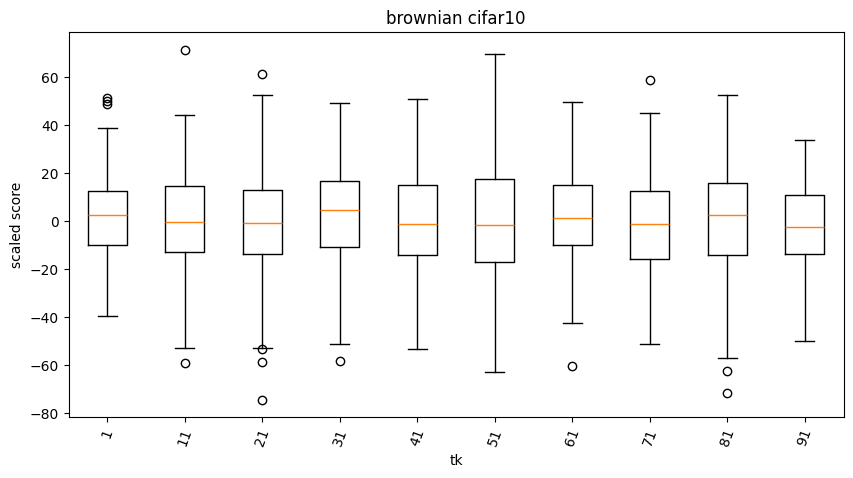

In [113]:
N_sim = 100

int_array = ret_dict.ravel()[0]['int_array']
int_array_scaled = int_array.copy()

for i, t in zip(range(100), range(1, N_sim, 10)):
    int_array_scaled[i,:] = int_array_scaled[i,:]*sqrt_one_minus_alphas_cumprod[t].item()

fig = plt.figure(figsize=(10,5))
plt.boxplot(list(int_array_scaled[:10]), tick_labels=ind)
plt.ylabel('scaled score')
plt.xlabel('tk')
plt.xticks(rotation=70)
plt.title(f"{method}" + title)
plt.show()

## svd

In [190]:
bridge_array = ret_dict.ravel()[0]['bridge_array']

In [191]:
test = bridge_array[9,999,].reshape((128,-1))

In [192]:
U, S, Wh = np.linalg.svd(test)

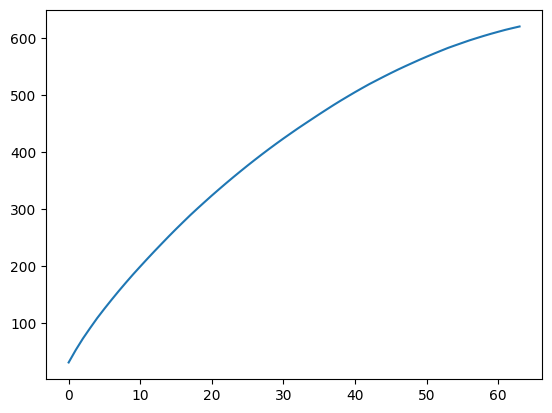

In [193]:
plt.plot(np.cumsum(S))
plt.show()

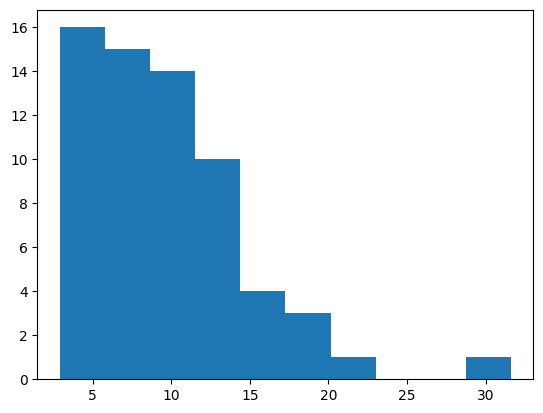

In [194]:
plt.hist(S)
plt.show()

In [195]:
S

array([31.607632 , 21.970055 , 20.081087 , 18.232433 , 17.649893 ,
       16.280416 , 15.683466 , 15.260942 , 14.72961  , 14.386959 ,
       13.792789 , 13.607544 , 13.355213 , 13.060065 , 12.974433 ,
       12.625035 , 12.294474 , 12.167855 , 11.61253  , 11.362363 ,
       11.259693 , 10.906481 , 10.753601 , 10.519702 , 10.286692 ,
       10.131957 ,  9.863716 ,  9.692638 ,  9.461701 ,  9.234242 ,
        9.035507 ,  8.784871 ,  8.704583 ,  8.384908 ,  8.305893 ,
        8.292423 ,  8.106965 ,  8.028232 ,  7.7308455,  7.483634 ,
        7.378202 ,  7.1254916,  6.994607 ,  6.5010533,  6.447396 ,
        6.309593 ,  6.1347117,  5.846119 ,  5.68074  ,  5.6438513,
        5.4082   ,  5.28197  ,  5.1339903,  5.0407653,  4.4779077,
        4.388172 ,  4.364098 ,  3.9667993,  3.8737442,  3.6786962,
        3.479164 ,  3.4063146,  3.0209525,  2.9194107], dtype=float32)